***
## Real Estate Price Prediction(Data Cleaning & Preprocessing)
### Created By: Arezoo Tirdad
***

- [1. Objective](#1.-Objective)<br>
- [2. Data](#2.-Data)<br>
    - [2.1 Collecting Data](#2.1.-Collecting-Data)<br>
    - [2.2 EDA, Visualization & Preprocessing](#2.2-EDA,-Visualization-&-Preprocessing)<br>
        - [Adjusting Original Price for Inflation](#Adjusting-Original-Price-for-Inflation)
        - [Filtering Dataframe to Single Family Dwellings](#single-family)
        - [Handling Outliers](#outliers)
        - [Correlation between target and independent variables](#correlation)
        - [PCA & KMEANS](#pca&kmeans)

In [1]:
import warnings;
warnings.simplefilter('ignore')

# EDA & plotting
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.express as px #to plot geographical points
import plotly.graph_objects as go #to plot geometry objects
import geopandas as gpd
from shapely.geometry import Point, Polygon, MultiPolygon
import plotly.offline as pyo
pyo.init_notebook_mode()
pd.set_option('display.float_format', lambda x: f'{x:,.2f}')

from sklearn.preprocessing import StandardScaler

# 1. Objective

The objective of this project is to accurately predict the prices of single-family dwellings in Austin, TX, based on historical sales data between 2018 and 2021. By leveraging various features such as location, property size, number of bedrooms and bathrooms, and other relevant factors, the model aims to provide reliable estimates for future property prices. Accurate house price prediction is crucial for several reasons: it aids potential buyers and sellers in making informed decisions, helps real estate professionals set competitive prices, assists appraisers and mortgage lenders in evaluating property values, and supports city planners and policymakers in understanding market trends and housing affordability. This can ultimately contribute to a more transparent and efficient real estate market.

This dataset, scraped from Zillow, was acquired from Kaggle. It's a regression problem with the label(latestPrice) present. The evaluation metrics will be R2 & RMSE.

    - https://www.kaggle.com/datasets/ericpierce/austinhousingprices

# 2. Data
## 2.1 Collecting Data

In [2]:
df = pd.read_csv('Austin, TX House Listings/austinHousingData.csv')
df.head(3)

,zpid,city,streetAddress,zipcode,description,latitude,longitude,propertyTaxRate,garageSpaces,hasAssociation,...,numOfMiddleSchools,numOfHighSchools,avgSchoolDistance,avgSchoolRating,avgSchoolSize,MedianStudentsPerTeacher,numOfBathrooms,numOfBedrooms,numOfStories,homeImage
0,111373431,pflugerville,14424 Lake Victor Dr,78660,"14424 Lake Victor Dr, Pflugerville, TX 78660 i...",30.43,-97.66,1.98,2,True,...,1,1,1.27,2.67,1063,14,3.00,4,2,111373431_ffce26843283d3365c11d81b8e6bdc6f-p_f...
1,120900430,pflugerville,1104 Strickling Dr,78660,Absolutely GORGEOUS 4 Bedroom home with 2 full...,30.43,-97.66,1.98,2,True,...,1,1,1.40,2.67,1063,14,2.00,4,1,120900430_8255c127be8dcf0a1a18b7563d987088-p_f...
2,2084491383,pflugerville,1408 Fort Dessau Rd,78660,Under construction - estimated completion in A...,30.41,-97.64,1.98,0,True,...,1,1,1.20,3.00,1108,14,2.00,3,1,2084491383_a2ad649e1a7a098111dcea084a11c855-p_...


In [3]:
df.shape

(15171, 47)

In [4]:
df.columns

Index(['zpid', 'city', 'streetAddress', 'zipcode', 'description', 'latitude',
       'longitude', 'propertyTaxRate', 'garageSpaces', 'hasAssociation',
       'hasCooling', 'hasGarage', 'hasHeating', 'hasSpa', 'hasView',
       'homeType', 'parkingSpaces', 'yearBuilt', 'latestPrice',
       'numPriceChanges', 'latest_saledate', 'latest_salemonth',
       'latest_saleyear', 'latestPriceSource', 'numOfPhotos',
       'numOfAccessibilityFeatures', 'numOfAppliances', 'numOfParkingFeatures',
       'numOfPatioAndPorchFeatures', 'numOfSecurityFeatures',
       'numOfWaterfrontFeatures', 'numOfWindowFeatures',
       'numOfCommunityFeatures', 'lotSizeSqFt', 'livingAreaSqFt',
       'numOfPrimarySchools', 'numOfElementarySchools', 'numOfMiddleSchools',
       'numOfHighSchools', 'avgSchoolDistance', 'avgSchoolRating',
       'avgSchoolSize', 'MedianStudentsPerTeacher', 'numOfBathrooms',
       'numOfBedrooms', 'numOfStories', 'homeImage'],
      dtype='object')

In [5]:
# no null values
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15171 entries, 0 to 15170
Data columns (total 47 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   zpid                        15171 non-null  int64  
 1   city                        15171 non-null  object 
 2   streetAddress               15171 non-null  object 
 3   zipcode                     15171 non-null  int64  
 4   description                 15171 non-null  object 
 5   latitude                    15171 non-null  float64
 6   longitude                   15171 non-null  float64
 7   propertyTaxRate             15171 non-null  float64
 8   garageSpaces                15171 non-null  int64  
 9   hasAssociation              15171 non-null  bool   
 10  hasCooling                  15171 non-null  bool   
 11  hasGarage                   15171 non-null  bool   
 12  hasHeating                  15171 non-null  bool   
 13  hasSpa                      151

We have **no null values** and **47 features**, out of which 7 are object type, 6 are boolean & the remaining 34 are numeric.

- **Object columns**: city, streetAddress, description, homeType, description, latest_saledate, latestPriceSource & homeImage
- **Boolean columns**: hasAssociation, hasCooling, hasGarage, hasHeating, hasSpa, hasView


## 2.2 EDA, Visualization & Preprocessing

In [6]:
# Some of the numerical columns
df.describe(include=['int64'])

,zpid,zipcode,garageSpaces,parkingSpaces,yearBuilt,numPriceChanges,latest_salemonth,latest_saleyear,numOfPhotos,numOfAccessibilityFeatures,...,numOfWindowFeatures,numOfCommunityFeatures,numOfPrimarySchools,numOfElementarySchools,numOfMiddleSchools,numOfHighSchools,avgSchoolSize,MedianStudentsPerTeacher,numOfBedrooms,numOfStories
count,"15,171.00","15,171.00","15,171.00","15,171.00","15,171.00","15,171.00","15,171.00","15,171.00","15,171.00","15,171.00",...,"15,171.00","15,171.00","15,171.00","15,171.00","15,171.00","15,171.00","15,171.00","15,171.00","15,171.00","15,171.00"
mean,"104,419,285.51","78,735.93",1.23,1.22,"1,988.55",3.03,6.73,"2,019.08",30.64,0.01,...,0.21,0.02,0.94,0.05,1.04,0.98,"1,237.30",14.86,3.44,1.47
std,"317,942,556.85",18.89,1.35,1.35,21.58,2.49,3.15,0.81,21.18,0.18,...,0.49,0.21,0.24,0.23,0.26,0.29,326.51,1.74,0.85,0.52
min,"28,584,946.00","78,617.00",0.00,0.00,"1,905.00",1.00,1.00,"2,018.00",1.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,396.00,10.00,0.00,1.00
25%,"29,411,153.00","78,727.00",0.00,0.00,"1,974.00",1.00,4.00,"2,018.00",20.00,0.00,...,0.00,0.00,1.00,0.00,1.00,1.00,966.00,14.00,3.00,1.00
50%,"29,494,414.00","78,739.00",1.00,1.00,"1,993.00",2.00,7.00,"2,019.00",29.00,0.00,...,0.00,0.00,1.00,0.00,1.00,1.00,"1,287.00",15.00,3.00,1.00
75%,"70,337,622.50","78,749.00",2.00,2.00,"2,006.00",4.00,9.00,"2,020.00",39.00,0.00,...,0.00,0.00,1.00,0.00,1.00,1.00,"1,496.00",16.00,4.00,2.00
max,"2,146,313,225.00","78,759.00",22.00,22.00,"2,020.00",23.00,12.00,"2,021.00",179.00,8.00,...,4.00,8.00,2.00,2.00,3.00,2.00,"1,913.00",19.00,20.00,4.00


 - zpid is Zillow property id. We have 15171 rows. Let's check if they're all unique listings, if they are, we'll drop the column later.
 - There are a lot of outliers in columns garageSpaces, parkingSpaces, numPriceChanges, numOfBedrooms.
 - yearBuilt column spans from 1905 to 2020, with average of 1988(making half of the buildings less than 35 years old).
 - There are a lot of information about schools which is typically a factor for a lot of people. There aren't many elementary schools but it's compensated by middle and high schools. So, number of elementary school may be an important feature.
 - avgSchoolSize & avgSchoolRating seem **normally distributed**. Average distance to a school is about 3km so not walking distance. It may make that a driving factor on price.
 - On average, listings have 3 bedrooms.

In [7]:
# rest of numerical columns
df.describe(include=['float64'])

,latitude,longitude,propertyTaxRate,latestPrice,lotSizeSqFt,livingAreaSqFt,avgSchoolDistance,avgSchoolRating,numOfBathrooms
count,"15,171.00","15,171.00","15,171.00","15,171.00","15,171.00","15,171.00","15,171.00","15,171.00","15,171.00"
mean,30.29,-97.78,1.99,"512,767.74","119,083.97","2,208.32",1.84,5.78,2.68
std,0.10,0.08,0.05,"453,185.31","12,252,718.78","1,378.58",1.07,1.86,1.05
min,30.09,-98.02,1.98,"5,500.00",100.00,300.00,0.20,2.33,0.00
25%,30.20,-97.84,1.98,"309,000.00","6,534.00","1,483.00",1.10,4.00,2.00
50%,30.28,-97.77,1.98,"405,000.00","8,276.00","1,975.00",1.57,5.78,3.00
75%,30.37,-97.72,1.98,"575,000.00","10,890.00","2,687.00",2.27,7.00,3.00
max,30.52,-97.57,2.21,"13,500,000.00","1,508,482,800.00","109,292.00",9.00,9.50,27.00


 - PropertyTaxRate seems relatively consistant across all listings.
 - There are a lot of outliers in columns numOfBathrooms, lotSizesSqFt, livingAreaSqFt.
 - Price spans from \\$5,500 to \\$13,500,000 with an average of \\$512,700.
 There must be some **outliers** which is expected but we should investigate.
 - There are listings with 0 numOfBathrooms which is suspicious as it's a building code issue, let's check them.
 - lotSizeSqFt spans from 100 to 1,508,482,800 sqft & average of 119,083.(we'll investigate both highest & lowest numbers)
 - livingAreaSqFt spans from 300 to 109,292 sqft & average of 2,208. (the 300 seems too low, also we should investigate the high numbers)
 - On average, listings have 2 to 3 bathrooms.

In [8]:
# Boolean columns
df.describe(include=['bool'])

,hasAssociation,hasCooling,hasGarage,hasHeating,hasSpa,hasView
count,15171,15171,15171,15171,15171,15171
unique,2,2,2,2,2,2
top,True,True,True,True,False,False
freq,8007,14897,8346,15022,13972,11716


 - Most of listings have both heating and cooling so shouldn't be an important feature but hasAssociation & hasGarage are almost half/half. 
 - We have to check how much hasView changes the price too.

**So far, Key features assumed to drive up the price are:**
- yearBuilt, livingAreaSqFt, lotSizeSqFt, avgSchoolDistance, avgSchoolRating, numOfElementarySchools,(numOfBedrooms, numOfBathrooms), hasGarage, hasView, hasAssociation

#### A quick look at categorical columns

In [9]:
df.describe(include=['O'])

,city,streetAddress,description,homeType,latest_saledate,latestPriceSource,homeImage
count,15171,15171,15171,15171,15171,15171,15171
unique,9,15164,15133,10,958,225,15171
top,austin,10816 Mickelson Dr,Coming soon! Photos and details will be availa...,Single Family,2019-06-28,Agent Provided,111373431_ffce26843283d3365c11d81b8e6bdc6f-p_f...
freq,15020,2,12,14241,68,10486,1


In [10]:
df['homeType'].value_counts().round(2)
# Most of the listings are Single Family homes. It'll be more logical to have different price prediction models for different
# building types(e.g. lot area of a single family house has a complete different meaning from lot size of a condo) 
# In this notebook, because most of our listings are Single Family homes(94%), we're going to filter out everything else.
# Removing these other types may also help with our outlier problem. Rows with high number of bedroom or bathrooms may very well
# be for these other types like multiFamily or Apartments.

Single Family            14241
Condo                      470
Townhouse                  174
Multiple Occupancy          96
Vacant Land                 83
Residential                 37
Apartment                   37
Mobile / Manufactured       17
MultiFamily                 10
Other                        6
Name: homeType, dtype: int64

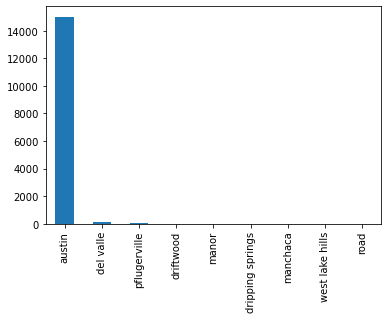

In [11]:
df['city'].value_counts().plot(kind='bar');
# Given the distribution, we can change the column to a boolean to just answer if it's in Austin or a suburb.
# We'll still get the effect of location from the feature for zipcode

In [12]:
df['streetAddress'].str.extract(r'(?P<street_name>\s(?:[a-zA-Z0-9]\s*)+)').nunique()
# There are 6,263 different streets.

street_name    6263
dtype: int64

In [13]:
# Dates
# We should adjust house prices for inflation
print(f"our data starts at {df['latest_saledate'].min()} and finishes on {df['latest_saledate'].max()}")

our data starts at 2018-01-22 and finishes on 2021-01-30


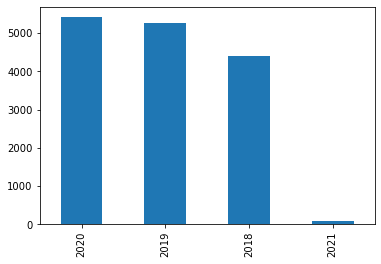

In [14]:
# Number of records in each year
df['latest_saleyear'].value_counts().plot(kind='bar');

### Adjusting Original Price for Inflation
Looking at nominal values(latestPrice), the increase/decrease in real estate prices will encompass both changes in the actual value of the property and changes in the general price level due to inflation. 
To perform accurate analysis on the evolving real estate market, we can explicitly account for inflation and calculate "real price" vs. nominal price. For the purpose of this ML model, we want to estimate house prices considering purchasing power in 2021 so we'll adjust prices using accumulated inflation rates sequentially from the year a property was sold up to base year, 2021. <br>
If we want to estimate prices for year 2024 for example, we either need to have the sales record or apply real estate appreciation rates for year following our last record. As a final test, we can run our model on sold properties in mid or late 2019 to see how it could have performed deployed using the most recent records at that time.

#### Consumer Price Index Historical Tables for U.S. City Average
https://www.bls.gov/regions/mid-atlantic/data/consumerpriceindexhistorical_us_table.htm

In [15]:
# latest inflations rates reported for each year(average of months reported) 
inflation_rates = {
    '2019':1.82,
    '2020':1.23,
    '2021':1.4, # we only have data till end of january, inflation went past 5% from May that year
    '2022':0
}
# inflation_rates = {
#     '2019':1.82,
#     '2020':1.23,
#     '2021':4.7,
#     '2022':8.02,
#     '2023':4.13,
#     '2024':3.27,
#     '2025':0
# }

# function to adjust price year by year using inflation rates to find "real price" of a house
# Formula: Adjusted Price = Nominal Price × (1+Inflation Rate from year before)
# adjusting price cumutively from year sold to base year which is 2021
def adjust_price(row):
    """
    function to return prices adjusted for inflation reflecting purchasing power in 2024, using cumulative rates of years after
    property is sold.
    """
    year = row['latest_saleyear']
    price = row['latestPrice']
    
    while year <= 2021:
        price = price * (1 + inflation_rates[str(year+1)]/100) #Rewriting price equivalent to value next year
        year += 1 #Going a year ahead
    return round(price, 2) #Returning purchase value in 2021

# new column showing adjusted price for all listings
df['price'] = df.apply(adjust_price, axis=1)

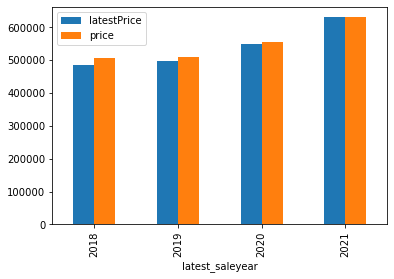

In [16]:
# average of original price and price adjusted for inflation if base year=2021
# note that we only have one month of records in 2021
df[['latest_saleyear', 'latestPrice', 'price']].groupby('latest_saleyear').mean().plot(kind='bar');

In [17]:
# How much was the appreciation over the years for single family category?
# Looking at single family dwelling category, average price(nominal and adjusted separately) each year is:
df[df.homeType=='Single Family'][['latest_saleyear', 'latestPrice', 'price']].groupby(['latest_saleyear']).mean()\
.rename(columns={'latestPrice':'nominal_price', 'price':'adjusted_price'})

,nominal_price,adjusted_price
latest_saleyear,,
2018,"490,919.88","513,086.88"
2019,"499,518.54","512,741.89"
2020,"551,894.74","559,621.27"
2021,"642,727.96","642,727.96"


In [18]:
# How much was the actual property appreciation(excluding inflation)?
# '2019':1.82
# '2020':1.23
# '2021':1.4
df[df.homeType=='Single Family'][['latest_saleyear', 'latestPrice', 'price']].groupby(['latest_saleyear']).mean()\
.apply(lambda x:(x.diff()/x)*100)\
.rename(columns={'latestPrice':'appreciation_value+inflation', 'price':'appreciation_property_value'})

,appreciation_value+inflation,appreciation_property_value
latest_saleyear,,
2018,NaN,NaN
2019,1.72,-0.07
2020,9.49,8.38
2021,14.13,12.93


From the 3 years we have the data for the whole year, 2020 had the highest number of houses sold & we can see had the most rate of appreciation as well. This coincides with the 2nd year of Covid pandemic when work from home was the new normal and trends such as looking for houses that can accomodate extended families were picking up.

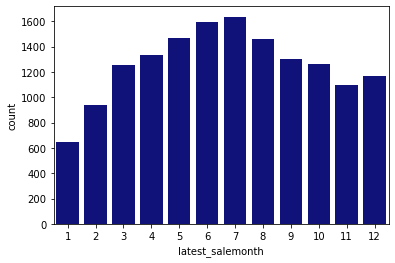

In [19]:
# More listings were sold in spring and summer months
sns.countplot(data=df, x='latest_salemonth', color='darkblue');

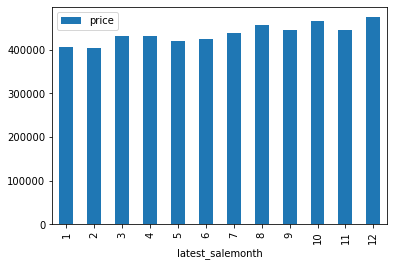

In [20]:
# Median house price is slightly lower in January and February in all the years we have data for the whole year 
# we should check this again after removing outliers
df[df.latest_saleyear.isin([2020])][['price', 'latest_salemonth']].groupby('latest_salemonth').median().plot(kind='bar');

In [21]:
# Are all zpid unique? if so, we can drop the column.
df['zpid'].nunique()

15171

In [22]:
# There are only 5 properties relisted
from collections import Counter
Counter(df.streetAddress).most_common(5)

[('2604 Arion Cir', 2),
 ('238 Lavaca Heights Dr', 2),
 ('4716 Amarra Dr', 2),
 ('11209 Lost Maples Trl', 2),
 ('10816 Mickelson Dr', 2)]

<a id="single-family"></a>
### Filtering DataFrame to Single Family & some preprocessing
There are some price outliers but before we check the distribution of individual columns, let's filter out homeType to include only Single Family dwelling given its ratio of the dataset. Also, we'll be dropping some of the unnecessary columns.

In [24]:
# Filtering
df = df[df['homeType'] == 'Single Family']

# replacing column 'city' with a boolean feature(in_austin)
df['in_austin'] = df['city'].mask(df['city'] != 'austin', False).map({False:0, 'austin':1})

df['street'] = df['streetAddress'].str.extract(r'(?P<street_name>\s(?:[a-zA-Z0-9]\s*)+)')

# mapping boolean columns to 0 & 1
for col in df.columns:
    if df[col].dtype == 'bool':
        df[col] = df[col].astype(int)

# adding a feature for floor space index      
df['fsi'] = df['livingAreaSqFt'] / df['lotSizeSqFt']

# Getting a building_age from yearBuilt
df['buildingAge'] = 2021 - df['yearBuilt']

# Binning to differentiate between the age of buildings(boundaries based on MLS: numerical labels, newer building, higher #)
bin_boundary = [0, 5, 15, 30, 50, 99, 200]
bin_label = [5, 4, 3, 2, 1, 0]
df['age_binned'] = pd.cut(df['buildingAge'], bins=bin_boundary, labels=bin_label).astype(int)

# a new feature if any schools within walking distance(1.5 miles can be considered for secondary schools as feature doesn't differentiate)
df['has_school_walking'] = [1 if num<=1.5 else 0 for num in df['avgSchoolDistance']]

# Dropping columns
df = df.drop(columns=['zpid', 'homeImage', 'latestPriceSource', 'numOfPhotos', 'latest_saledate', 'homeType'])

df.shape

(14241, 48)

In [25]:
print('min latitude: {:.3f}, max latitude: {:.3f}'.format(df.latitude.min(), df.latitude.max()))
print('min longitude: {:.3f}, max lomgitude: {:.3f}'.format(df.longitude.min(), df.longitude.max()))

min latitude: 30.085, max latitude: 30.517
min longitude: -98.022, max lomgitude: -97.570


#### Original & Adjusted Price

In [26]:
# What is the distribution of price?
df['price'].describe()

count       14,241.00
mean       530,175.70
std        458,857.94
min          5,748.24
25%        318,771.97
50%        418,782.00
75%        590,221.52
max     14,109,578.92
Name: price, dtype: float64

In [27]:
#original price
df['latestPrice'].describe()

count       14,241.00
mean       516,387.88
std        446,969.18
min          5,500.00
25%        310,000.00
50%        409,900.00
75%        575,000.00
max     13,500,000.00
Name: latestPrice, dtype: float64

Average adjusted house price is 530,175.70


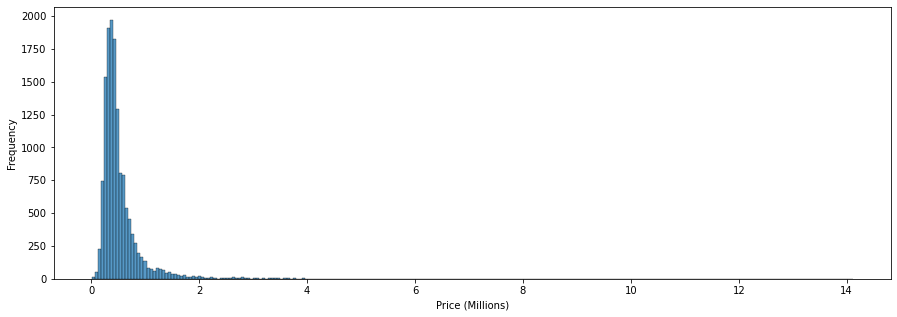

In [28]:
print(f"Average adjusted house price is {df['price'].mean():,.2f}")
plt.figure(figsize=[15,5])
sns.histplot(x=df['price']/1000000, bins=250)
plt.xlabel('Price (Millions)')
plt.ylabel('Frequency')
plt.show();

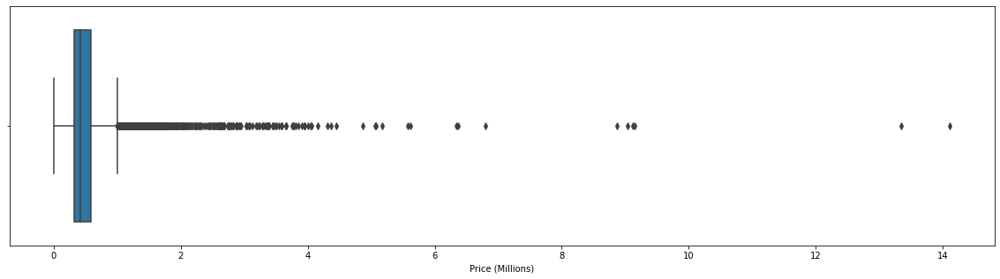

In [29]:
#There are a lot of outliers in price(mostly luxury properties). Our model won't be able to accurately predict for these houses.
#Better way would be to train a different model for these houses but first let's see how many are above the top whisker
plt.figure(figsize=[20,5])
sns.boxplot(data=df[['price']]/1000000, x='price')
plt.xlabel('Price (Millions)')
plt.show();

In [30]:
# There are 14 listings with adjusted price greater than $5 million.
df[['lotSizeSqFt', 'livingAreaSqFt', 'latestPrice', 'price', 'streetAddress', 'zipcode', 'latest_saleyear']]\
[df['price'] > 5000000].sort_values(by='price', ascending=False)
# These are the top 4 most expensive zipcodes in our dataset. 

,lotSizeSqFt,livingAreaSqFt,latestPrice,price,streetAddress,zipcode,latest_saleyear
2316,"710,899.20","15,394.00","13,500,000.00","14,109,578.92",12400 Cedar St,78732,2018
14275,"10,454.00","4,441.00","13,000,000.00","13,344,138.60",5909 Lookout Mountain Dr,78731,2019
1298,"204,296.40","9,210.00","8,750,000.00","9,145,097.45",5401 Maryanna Dr,78746,2018
290,"87,120.00","7,745.00","8,999,000.00","9,124,986.00",2105 Island Wood Rd,78733,2020
14639,"26,136.00","6,596.00","8,799,000.00","9,031,928.89",3904 Waters Edge Dr,78731,2019
14376,"79,714.80","6,046.00","8,750,000.00","8,872,500.00",4902 Tortuga Pl,78731,2020
14395,"48,787.20","7,904.00","6,499,000.00","6,792,455.81",4406 Island Cv,78731,2018
1360,"257,004.00","11,622.00","6,200,000.00","6,364,127.64",14300 Flat Top Ranch Rd,78732,2019
14627,"37,026.00","5,775.00","6,250,000.00","6,337,500.00",3811 Westlake Dr,78746,2020
193,"116,305.20","7,740.00","5,474,997.00","5,619,932.22",14624 Flat Top Ranch Rd,78732,2019


In [31]:
# let's have a look at the low end of price
df[['lotSizeSqFt', 'livingAreaSqFt', 'latestPrice', 'price', 'latest_saleyear', 'streetAddress', 'zipcode']]\
[df['latestPrice'] < 150000].sort_values(by='latestPrice')
# Many of the prices below don't seem to have legitimate prices(they may be transfers between family members or simply wronge 
# input). Even for properties priced at 150k, estimated price on most platforms is more than 350k
# I'll be dropping all. I assume there are more listings like these but we won't be able to accurately identify them.
# Since I'm checking sold prices on other platforms, latestPrice was checked, not price

,lotSizeSqFt,livingAreaSqFt,latestPrice,price,latest_saleyear,streetAddress,zipcode
844,"9,060.00","4,094.00","5,500.00","5,748.35",2018,3302 Blue Jay Ln,78732
5796,"14,374.80","6,000.00","5,600.00","5,748.24",2019,1812 Eagles Glen Cv,78732
785,"16,117.20","4,979.00","5,800.00","5,953.54",2019,7109 Greenshores Dr,78730
9310,"6,734.00","2,330.00","6,000.00","6,158.83",2019,1907 Holly St,78702
13184,"10,005.00","2,693.00","6,300.00","6,466.77",2019,1500 Hartford Rd,78703
...,...,...,...,...,...,...,...
3873,"7,840.00","1,362.00","149,900.00","156,668.58",2018,5714 Shreveport Dr,78727
11287,"5,227.00","2,350.00","149,900.00","153,868.18",2019,934 E 50th St,78751
12031,"4,617.00","1,279.00","149,983.00","153,953.38",2019,1613 Sir Thopas Trl,78748
12115,"10,890.00","1,501.00","149,990.00","153,960.57",2019,10215 Bilbrook Pl,78748


In [32]:
# There are a couple of small cities in the greater Austin area who have most of their listings recorded as Austin, 
# such as Hornsby bend & Wells Branch but the coordinates in general seem correct. Zipcode will be the feature that explains 
# correlation between price and location so we can ignore the wronge city names. 
fig = px.scatter_mapbox(
    df, lat=df['latitude'], lon=df['longitude'], color='price', hover_name='city'
)
fig.update_layout(
    mapbox={'style': "carto-positron", 'center': {'lon': -97.74, 'lat': 30.33}, 'zoom': 9}
)
fig.show()

In [33]:
df.city.value_counts()

austin              14096
del valle              84
pflugerville           34
driftwood              12
manor                   5
dripping springs        4
manchaca                3
west lake hills         2
road                    1
Name: city, dtype: int64

In [34]:
df.price.quantile(0.98)

1735764.4919999945

In [35]:
# plotting listings with price in the 98% quartile
df_minus_outliers = df[df['price'] < 1735000]
fig = px.scatter_mapbox(
    df_minus_outliers, lat=df_minus_outliers['latitude'], lon=df_minus_outliers['longitude'], color='price'
)

fig.update_layout(
    mapbox={'style': "carto-positron", 'center': {'lon': -97.74, 'lat': 30.33}, 'zoom': 9}
)
fig.show()

#### Building age or yearBuilt

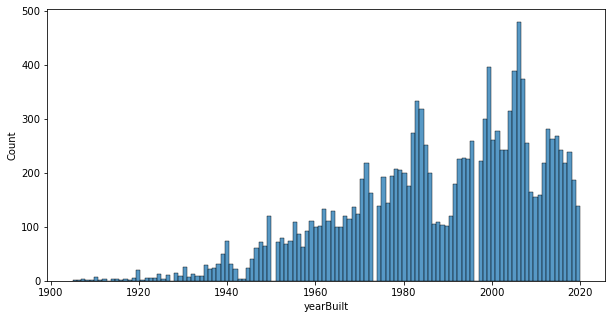

In [39]:
# What is the distribution of yearBuilt?
# Looking at yearBuilt, most of buildings are built after 1980 and we can see listings are not of very old buildings
plt.figure(figsize=(10,5))
sns.histplot(df['yearBuilt'], bins=120);

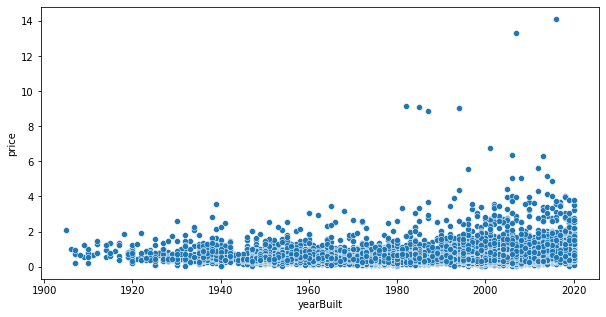

In [40]:
# price and yearBuilt
plt.figure(figsize=(10,5))
sns.scatterplot(y=df['price']/1000000, x=df['yearBuilt']);

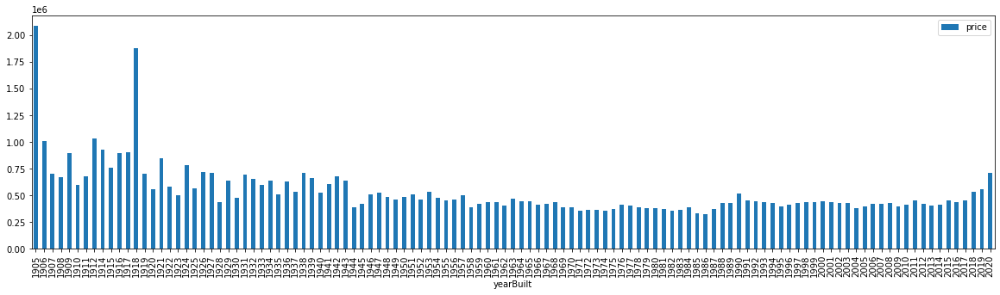

In [41]:
# considering scatterplot above, there are understandably less properties built before 1920. Possibly considered heritage and 
# undergone considerable renovation, they're mostly all priced in the top half of our listing, hence the higher price average.
# It may be a good idea to remove properties that are older than 100 years. 
df[['yearBuilt','price']].groupby('yearBuilt').median().plot(kind='bar', figsize=[20,5]);

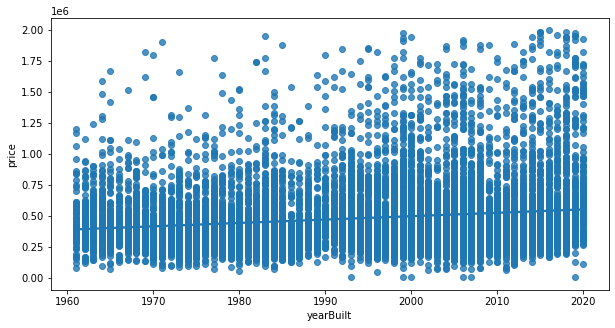

In [42]:
# price & yearBuilt for buildings in the 98% percentile of price(less than $1.735 mil)
plt.figure(figsize=(10,5))
sns.regplot(data=df[(df['yearBuilt']>1960) & (df['price']<2000000)], x='yearBuilt', y='price');

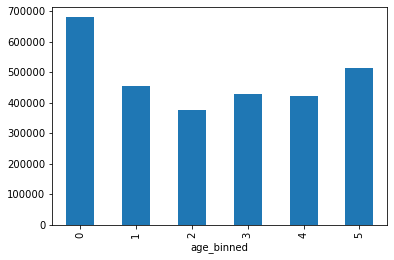

In [43]:
# Average price in each house age bin 
# (5 = less than 5yrs) (4 = 5 to 14) (3 = 15 to 29) (2 = 30 to 49) (1 = 50 to 99) (0 = +100yrs)
# We're going to limit our dataset to properties less than 100 years old(there are only 57 houses age +100)
# although new buildings still show higher average price, it may be unusual to see house 50-99 were sold for more
# compared to 30-49 years old houses. 
df.groupby('age_binned')['price'].median().plot(kind='bar');

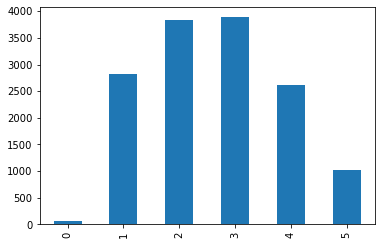

In [44]:
# number of listings in each bin
df.age_binned.value_counts().sort_index().plot(kind='bar');

Considering the number of old and new houses(respectively in bins 1 & 5), it can be concluded that there may be a shortage of housing supply and as a result, possibly, older properties, suitable for demolition and rebuild, get multiple offers and this drives up their median price. 

Looking for any evidence of this hypothesis, I found this article which explains Austin did in fact had a housing shortage in the years prior to 2022.
https://www.axios.com/local/austin/2024/01/18/housing-market-austin-why-homes-inventory

In [45]:
# older buildings are mostly around the core of the city
fig = px.scatter_mapbox(df[df.age_binned > 0], lat='latitude', lon='longitude', color='buildingAge', hover_name='streetAddress',
                        center=dict(lat=30.33, lon=-97.74), zoom=9,
                        mapbox_style="carto-positron")

fig.show()

#### Zipcode

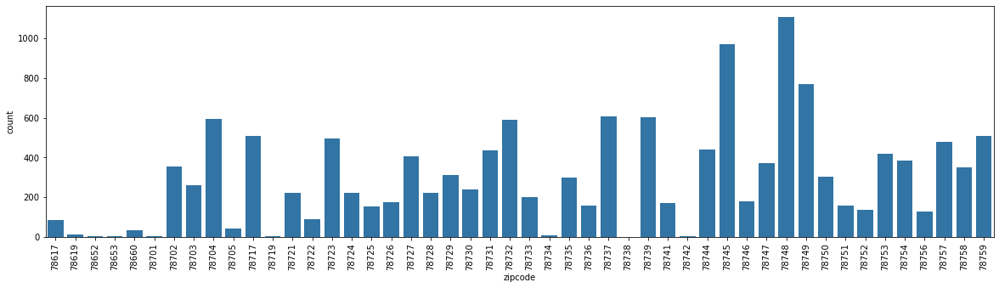

In [46]:
# Distribution of zipcode?
# There aren't many records in some of the zipcodes so it'll be expected that the model may not work equally well for all
plt.figure(figsize=(20,5))
plt.xticks(rotation=90)
sns.countplot(df.zipcode, color='#1f77b7');

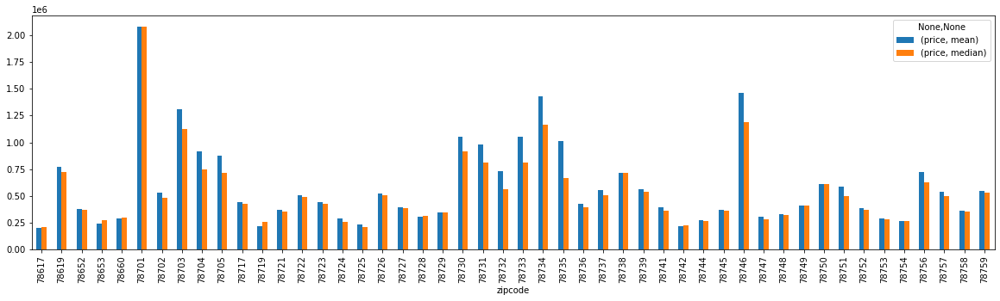

In [47]:
# median and mean price in each zipcode 
# 78731, 78732, 78733 & 78746 had the most expensive listings
df[['zipcode','price']].groupby('zipcode').agg(['mean', np.median]).plot(kind='bar', figsize=(20,5));

In [48]:
# statistics of price within a zipcode with 200 listings
# given the size of zipcodes and variance within each, zipcode can't be a good indicator of location on its own
df[['price']][df['zipcode']==78733].describe()

,price
count,200.00
mean,"1,048,570.72"
std,"926,148.97"
min,"205,294.44"
25%,"602,712.26"
50%,"808,062.18"
75%,"1,082,438.49"
max,"9,124,986.00"


In [49]:
# example of a zipcode with very few records
df[['zipcode','price']][df['zipcode']==78701]

,zipcode,price
9249,78701,"3,587,520.34"
9251,78701,"573,789.54"


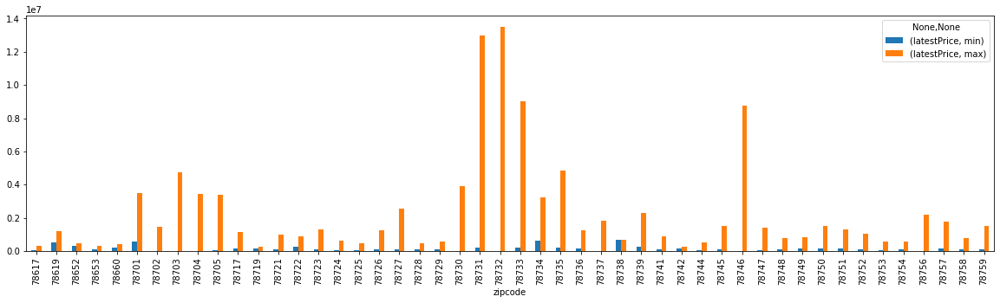

In [50]:
# minimum and maximum price in each zipcode
df[['zipcode','latestPrice']].groupby('zipcode').agg([min, max]).plot(kind='bar', figsize=(20,5));
# Given the big range of price within a zipcode, we probably still need latitude and longitude as features to explain location's
# correlation with price

In [51]:
price_zipcode = df[['zipcode','latitude','longitude','price']]\
.groupby('zipcode').agg({'latitude': 'mean', 'longitude': 'mean', 'price': ['count', 'median']}).reset_index()
price_zipcode.columns = ['zipcode','latitude','longitude','count','median_price']
price_zipcode.head()

,zipcode,latitude,longitude,count,median_price
0,78617,30.16,-97.63,84,"205,020.98"
1,78619,30.14,-97.98,12,"719,167.78"
2,78652,30.15,-97.85,4,"365,982.52"
3,78653,30.37,-97.61,3,"273,769.86"
4,78660,30.42,-97.65,34,"299,805.89"


In [52]:
# Bubble map visualizing average price in each zipcode with size of bubble representing number of listings
fig = px.scatter_mapbox(price_zipcode, lat='latitude', lon='longitude', size='count', size_max=40,
                        color='median_price',
                        hover_name='zipcode', 
                        center=dict(lat=30.33, lon=-97.74), zoom=9,
                        mapbox_style="carto-positron")

fig.show()

In [53]:
# a dataframe of boundaries of zipcodes in Austin
zipcodes_austin = pd.read_csv("austin_Boundaries__Zip_Code.csv", usecols=['the_geom', 'Zip Code'])\
.rename(columns={'Zip Code':'zipcode', 'the_geom':'geometry'})

# median price in each zipcode
price_zipcode = df[['zipcode','price']].groupby('zipcode').mean().reset_index()

price_zipcode = price_zipcode.merge(zipcodes_austin, how='inner', on='zipcode').rename(columns={'price':'average_price'})

# Making a Geopandas dataframe & setting geometry column
price_zipcode = gpd.GeoDataFrame(price_zipcode, geometry=gpd.GeoSeries.from_wkt(price_zipcode['geometry']))

price_zipcode.head()

,zipcode,average_price,geometry
0,78617,"202,724.53","MULTIPOLYGON (((-97.68080 30.13511, -97.67810 ..."
1,78652,"380,594.51","MULTIPOLYGON (((-97.95598 30.11823, -97.91607 ..."
2,78653,"242,127.91","MULTIPOLYGON (((-97.63882 30.35289, -97.63077 ..."
3,78660,"292,693.47","MULTIPOLYGON (((-97.67159 30.42442, -97.66851 ..."
4,78701,"2,080,654.94","MULTIPOLYGON (((-97.75445 30.27024, -97.75230 ..."


In [54]:
# most expensive zipcode corresponds to downtown Austin but there are only two listings, one less than $1mil and one above $3mil
fig = px.choropleth_mapbox(price_zipcode, geojson=price_zipcode.geometry.__geo_interface__,
                           locations=price_zipcode.index,
                           color='average_price',
                           mapbox_style="carto-positron",
                           center=dict(lat=30.30, lon=-97.74),
                           opacity=0.5, zoom=9, hover_name='zipcode')
    
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [55]:
# same plot with price outliers removed
price_zipcode_minus_outliers = df_minus_outliers[['zipcode','price']].groupby('zipcode').mean().reset_index()\
.merge(zipcodes_austin, how='inner').rename(columns={'price':'average_price'})
price_zipcode_minus_outliers = gpd.GeoDataFrame(price_zipcode_minus_outliers, 
                                                geometry=gpd.GeoSeries.from_wkt(price_zipcode_minus_outliers['geometry']))

fig = px.choropleth_mapbox(price_zipcode_minus_outliers, geojson=price_zipcode_minus_outliers.geometry.__geo_interface__,
                           locations=price_zipcode_minus_outliers.index,
                           color='average_price',
                           mapbox_style="carto-positron",
                           center=dict(lat=30.30, lon=-97.74),
                           opacity=0.5, zoom=9, hover_name='zipcode')

fig.show()

#### Number of Stories

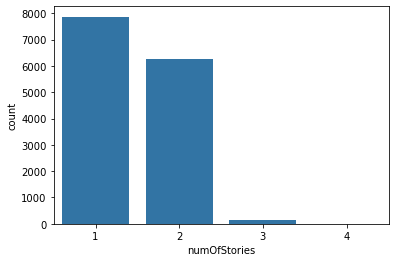

In [56]:
# Distribution of numOfStorie?
sns.countplot(x=df['numOfStories'], color='#1f77b7');

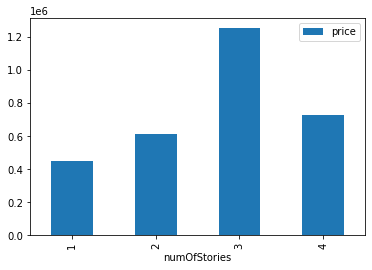

In [57]:
# numOfStories and price(There are only 2 records with 4 stories, we'll put a top boundary of 3)
df[['numOfStories','price']].groupby('numOfStories').mean().plot(kind='bar');

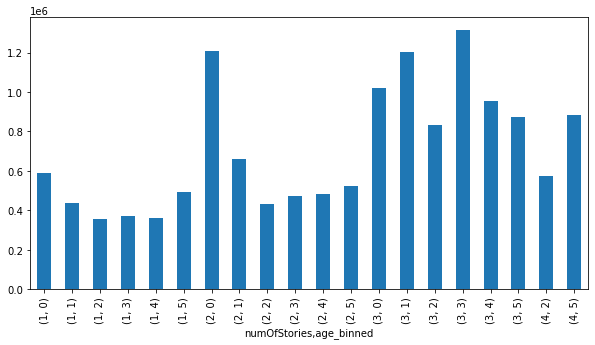

In [58]:
# Is there a relationship between numOfStories and age_binned together with price?
# (5 = less than 5yrs) (4 = 5 to 14) (3 = 15 to 29) (2 = 30 to 49) (1 = 50 to 99) (0 = +100yrs)
df[['numOfStories', 'age_binned', 'price']].groupby(['numOfStories','age_binned'])['price'].median().plot(kind='bar', figsize=(10,5));

#### Number of garage spaces

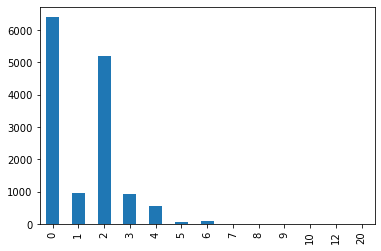

In [59]:
# Distribution of number of parking spaces
# There isn't much difference between number of garage and parking spaces, 
# garage implies a covered area which can be more desirable
df['garageSpaces'].value_counts().sort_index().plot(kind='bar');
# let's check listings with the highest number of parking spaces

In [60]:
df[['streetAddress', 'lotSizeSqFt', 'price', 'garageSpaces', 'parkingSpaces', 'numOfParkingFeatures']] \
[df['garageSpaces'] >= 10].sort_values(by='garageSpaces', ascending=False)
# Most of the numbers for garage spaces below seem wronge, either number of parking spaces in total or wronge input,
# my intuition is this is the case for most of the high numbers. We better use threshold capping or not use the column at all.
# numOfParkingFeatures seems more reasonable

,streetAddress,lotSizeSqFt,price,garageSpaces,parkingSpaces,numOfParkingFeatures
4533,13100 Rooster Springs Rd,"337,590.00","862,147.53",20,20,3
4777,3301 Barton Creek Blvd,"68,824.80","1,617,330.00",12,12,3
6805,7600 Elm Forest Rd,"27,007.20","538,897.91",12,12,1
6985,6907 Cherrydale Dr,"7,927.00","332,592.00",12,12,2
9240,908 Keith Ln,"20,908.80","3,447,600.00",12,12,4
11108,1405 Berkshire Dr,"7,797.00","507,000.00",12,12,2
1613,16101 Crystal Hills Dr,"118,918.80","785,850.00",10,10,2
3459,8909 Georgian Dr,"30,492.00","532,350.00",10,10,3
6230,1814 Randolph Ridge Trl,"30,056.40","1,933,534.89",10,10,3
9201,13712 Ann Pl,"16,552.80","283,818.60",10,10,2


In [61]:
df[['streetAddress', 'livingAreaSqFt', 'lotSizeSqFt', 'latestPrice', 'garageSpaces', 'parkingSpaces', 'numOfParkingFeatures']] \
[df['garageSpaces'] == 0].head()
# 6405 of the listings show 0 garageSpace. I checked the 5 below & all are wronge input, possibly due to absence of a number
# on the zillow website when it only mentions garage space as a feature

,streetAddress,livingAreaSqFt,lotSizeSqFt,latestPrice,garageSpaces,parkingSpaces,numOfParkingFeatures
2,1408 Fort Dessau Rd,"1,478.00","7,840.00","256,125.00",0,0,1
4,15005 Donna Jane Loop,"2,132.00","6,708.00","239,900.00",0,0,1
6,14009 Cantata Ln,"2,432.00","12,196.80","315,000.00",0,0,1
7,15009 Drusillas Dr,"1,422.00","5,140.00","219,900.00",0,0,1
8,1104 Traci Michelle Dr,"1,870.00","3,811.00","225,000.00",0,0,1


In [62]:
# I'll be using number of parkingSpaces instead but will mutate 0 values to 1 when numOfParkingFeatures=1
# Some may very well be 2 but we have no way of figuring out with any accuracy as parking features can be in reference to 
# things like on-street parking
df[['streetAddress', 'livingAreaSqFt', 'lotSizeSqFt', 'latestPrice', 'garageSpaces', 'parkingSpaces', 'numOfParkingFeatures']] \
[(df['parkingSpaces'] == 0) & (df['numOfParkingFeatures'] != 0)].head()

,streetAddress,livingAreaSqFt,lotSizeSqFt,latestPrice,garageSpaces,parkingSpaces,numOfParkingFeatures
2,1408 Fort Dessau Rd,"1,478.00","7,840.00","256,125.00",0,0,1
4,15005 Donna Jane Loop,"2,132.00","6,708.00","239,900.00",0,0,1
6,14009 Cantata Ln,"2,432.00","12,196.80","315,000.00",0,0,1
7,15009 Drusillas Dr,"1,422.00","5,140.00","219,900.00",0,0,1
8,1104 Traci Michelle Dr,"1,870.00","3,811.00","225,000.00",0,0,1


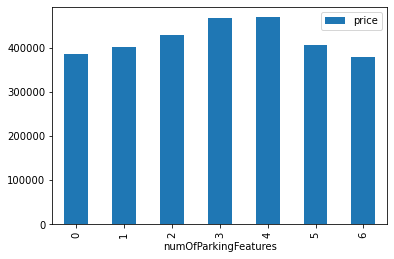

In [63]:
# is there a correlation between price and numfParkingFeatures?
df[['numOfParkingFeatures', 'price']].groupby('numOfParkingFeatures').median().plot(kind='bar');

In [64]:
df['parkingSpaces'].quantile(0.99)

5.0

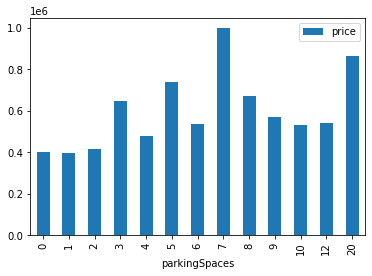

In [65]:
# only the top 1% has more than 5 parking spaces, threshold capping may help with the model
df[['parkingSpaces', 'price']].groupby('parkingSpaces').median().plot(kind='bar');

In [66]:
df['parkingSpaces'].value_counts()

0     6410
2     5204
1      950
3      916
4      556
6       95
5       71
8       12
7       11
10       7
12       5
9        3
20       1
Name: parkingSpaces, dtype: int64

#### Number of Security Features

In [67]:
df['numOfSecurityFeatures'].value_counts()

0    9856
1    2668
2    1206
3     412
4      80
5      17
6       2
Name: numOfSecurityFeatures, dtype: int64

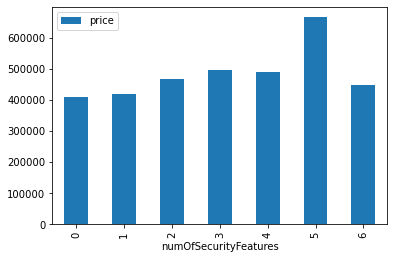

In [68]:
df[['numOfSecurityFeatures','price']].groupby('numOfSecurityFeatures').median().plot(kind='bar');

In [69]:
# we'll remove the two records with 6 security features or use a cap of 5
df[df['numOfSecurityFeatures']==6][['numOfSecurityFeatures','price','streetAddress']]

,numOfSecurityFeatures,price,streetAddress
3864,6,"418,275.00",11620 Elk Park Trl
8389,6,"481,650.00",6005 Emma Sophia Ln


#### Number of Bedrooms and Bathrooms

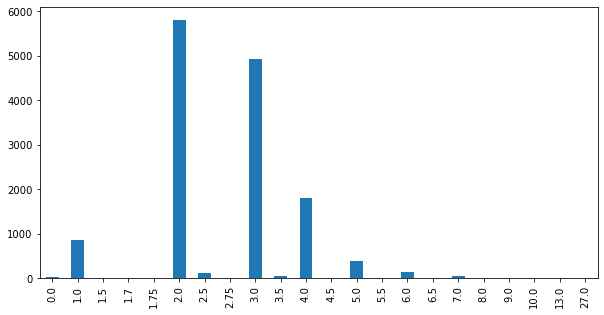

In [70]:
# distribution of number of bathrooms, we need to check listings with 0 and also the very high numbers
# rounding the numbers may also help with the model's performance by reducing the noise 
df['numOfBathrooms'].value_counts().sort_index().plot(kind='bar', figsize=(10,5));

In [71]:
df[['numOfBathrooms', 'livingAreaSqFt', 'latestPrice', 'streetAddress', 'zipcode', 'numOfParkingFeatures']][df['numOfBathrooms'] > 10]
# The listing with 27 bathrooms is actually 3 bathrooms so will be imputing it, the other one is correct which is the most 
# expensive listing in our dataset

,numOfBathrooms,livingAreaSqFt,latestPrice,streetAddress,zipcode,numOfParkingFeatures
2316,13.00,"15,394.00","13,500,000.00",12400 Cedar St,78732,2
2838,27.00,"2,137.00","745,000.00",4212 Far West Blvd,78731,2


In [72]:
# listings with 0 bathroom(21 listings), these can be imputed with a number proportional to number of bedrooms but given the
# small number of records we can just drop them
# Same thing for listings with 0 bedrooms(cross-referenced & all seem to be either no number shown or wronge input)
df[['numOfBathrooms', 'numOfBedrooms', 'livingAreaSqFt', 'price', 'streetAddress', 'zipcode']][df['numOfBathrooms'] == 0]

,numOfBathrooms,numOfBedrooms,livingAreaSqFt,price,streetAddress,zipcode
705,0.00,5,"109,292.00","402,384.29",201 Marly Way,78733
1842,0.00,0,"3,809.00","907,530.00",10640 Senna Hills Dr,78733
2223,0.00,4,"3,423.00","861,900.00",5138 Mansfield View Ct,78732
2557,0.00,1,"29,440.00","866,432.66",9704 Saugus Ln,78733
3328,0.00,3,"1,904.00","225,822.86",604 W Grady Dr,78753
3852,0.00,5,"1,956.00","244,300.38",11906 Doubloon Cv,78759
4464,0.00,4,"2,232.00","415,638.60",200 Lexington Dr,78737
4491,0.00,4,"2,557.00","351,464.08",348 Drury Ln,78737
6252,0.00,5,"5,187.00","991,851.14",2005 Real Catorce,78746
6646,0.00,0,"1,660.00","461,912.49",8604 Oak Ledge Dr,78748


In [73]:
# 10 listings with 0 bedrooms, most seem to be wrong. I'll be dropping them or impute during modeling
df[['numOfBathrooms', 'numOfBedrooms', 'livingAreaSqFt', 'latestPrice', 'streetAddress', 'yearBuilt']] \
    [df['numOfBedrooms'] == 0]

,numOfBathrooms,numOfBedrooms,livingAreaSqFt,latestPrice,streetAddress,yearBuilt
1842,0.00,0,"3,809.00","895,000.00",10640 Senna Hills Dr,2011
5098,3.00,0,"1,396.00","298,900.00",8904 Creekmont Cv,1983
6646,0.00,0,"1,660.00","450,000.00",8604 Oak Ledge Dr,1971
8607,2.00,0,"2,400.00","525,000.00",4201 Del Robles Dr,1982
8759,2.00,0,"1,085.00","234,000.00",2320 Klattenhoff Dr,1984
9685,1.00,0,526.00,"349,000.00",1187 Coleto St,1929
10006,2.00,0,"1,096.00","430,000.00",1413 Perez St,1930
11894,0.00,0,864.00,"400,000.00",409 W Odell St,1947
13601,2.00,0,"2,527.00","469,000.00",7224 Moon Rock Rd,2007
14972,1.00,0,864.00,"420,000.00",1902 Justin Ln,1951


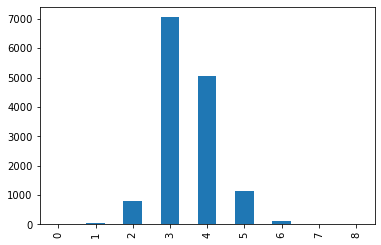

In [74]:
# Distribution of listings with certain number of bathrooms
df['numOfBedrooms'].value_counts().sort_index().plot(kind='bar');

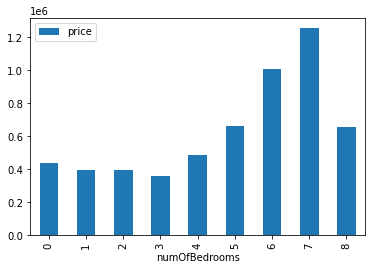

In [75]:
# price vs numOfBedrooms
df[['price', 'numOfBedrooms']].groupby('numOfBedrooms').median().plot(kind='bar');

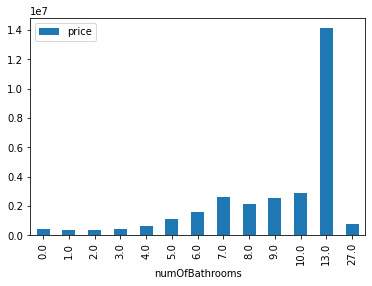

In [76]:
# price vs numOfBathrooms
df[['price', 'numOfBathrooms']].apply(lambda x: x.round()).groupby('numOfBathrooms').median().plot(kind='bar');

#### Lot Sizes

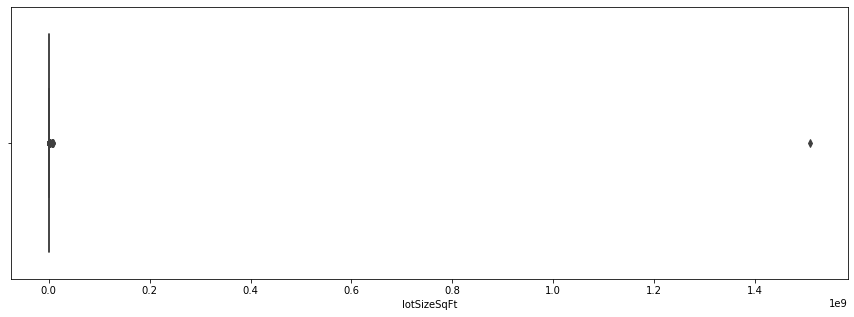

In [77]:
# What is the distribution of lotSizeSqFt?
# we have to decide how to handle outliers which are listings with very big lots
plt.figure(figsize=(15,5))
sns.boxplot(data=df, x='lotSizeSqFt');

In [78]:
df['lotSizeSqFt'].quantile(q=0.75)
# 75% of the listings has lots less than 0.25 acres(eg. a lot of 70'x155'), so most of listings have a relatively
# urban-scale lot size

10890.0

In [79]:
print('There are', len(df[df['lotSizeSqFt'] > 43560]), 'listings with more than 1 acre in lot size.')
# There are 477 listings(3.3%) with lot areas equal to or more than 1 acre 

There are 477 listings with more than 1 acre in lot size.


In [80]:
df['lotSizeSqFt'].describe()

count          14,241.00
mean          121,761.47
std        12,641,347.60
min               113.00
25%             6,621.00
50%             8,319.00
75%            10,890.00
max     1,508,482,800.00
Name: lotSizeSqFt, dtype: float64

In [81]:
# Let's look at the listing with the highest lot area, these are listings with lots bigger than 10 acres
df[['lotSizeSqFt', 'livingAreaSqFt', 'latestPrice', 'streetAddress']][df['lotSizeSqFt'] > 435600] \
.sort_values(by='lotSizeSqFt', ascending = False)
# The top 12 & the 15th row below are wrong, either wrong input or miscalculation in converting acre to square feet.
# I'll be dropping rows with wrong inputs which seem to be lots bigger than 24 acres.

,lotSizeSqFt,livingAreaSqFt,latestPrice,streetAddress
14654,"1,508,482,800.00","3,328.00","1,650,000.00",3200 W 35th St
2340,"8,712,000.00","3,183.00","569,000.00",4304 Front Range Ln
4635,"8,581,320.00","4,459.00","999,500.00",201 Charismatic Pl
8071,"5,967,720.00","1,217.00","225,000.00",16819 Village Oak Loop
3549,"5,902,380.00","1,166.00","435,000.00",1705 Barbara St
869,"5,880,600.00","3,688.00","599,900.00",14216 Tyburn Trl
1703,"2,988,216.00","2,655.00","439,900.00",689 Wild Rose Dr
1610,"2,988,216.00","2,095.00","379,900.00",910 Wild Rose Dr
10861,"2,178,000.00","1,793.00","188,673.00",2216 Buffalo Tundra Dr
4569,"1,516,323.60","2,819.00","325,000.00",223 Limestone Trl


In [82]:
# Checked all houses with less than 1000 sq.ft lot size and all 6 seem to be wronge input so I'll be dropping them
df[['lotSizeSqFt', 'livingAreaSqFt', 'latestPrice', 'streetAddress', 'zipcode']][df['lotSizeSqFt'] < 1000] \
.sort_values(by=['lotSizeSqFt'], ascending=False)

,lotSizeSqFt,livingAreaSqFt,latestPrice,streetAddress,zipcode
977,435.00,"1,753.00","342,000.00",854 Wild Rose Dr,78737
6122,435.00,"1,961.00","669,500.00",2604 Sutherland St,78746
10598,435.00,"1,104.00","500,000.00",407 Post Road Dr,78704
8959,392.00,"1,474.00","271,860.00",2004 Tasmanian Tiger Trce,78728
10475,117.00,"2,172.00","457,000.00",209 Starbright Dr,78745
11989,113.00,"1,245.00","305,000.00",9715 Holly Springs Dr,78748


#### Living Area

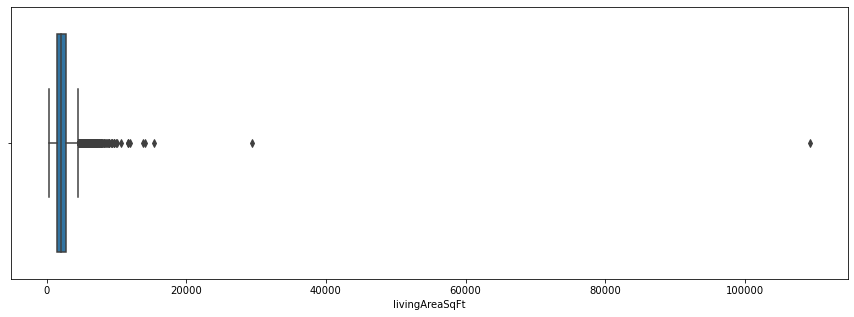

In [83]:
plt.figure(figsize=(15,5))
sns.boxplot(df['livingAreaSqFt']);

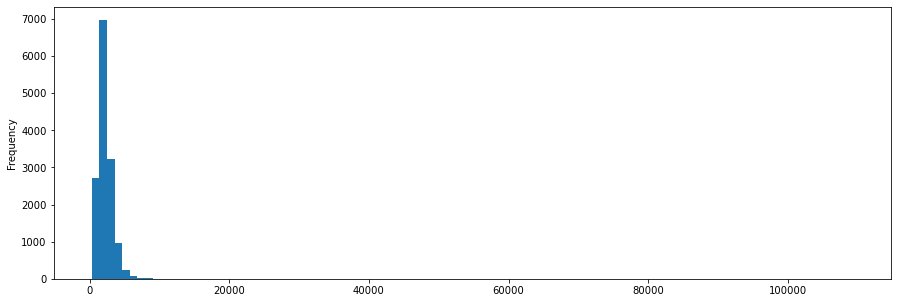

In [84]:
# What is the distribution of livingAreaSqFt?
df['livingAreaSqFt'].plot(kind='hist', bins=100, figsize=(15,5));

In [85]:
df['livingAreaSqFt'].quantile(q=0.95)
# 95% of listings have 4,000 sqft or less living area which seems typical of an urban-scale single family house.

4060.0

In [86]:
# These are the top 10 listings with the highest living area. Only the first top 2 seem to be typo so I'll be dropping them.
# indexs: 705 & 2557 
df[['livingAreaSqFt', 'lotSizeSqFt', 'latestPrice', 'streetAddress']][df['livingAreaSqFt'] > 10000] \
.sort_values(by=['livingAreaSqFt'], ascending=False)

,livingAreaSqFt,lotSizeSqFt,latestPrice,streetAddress
705,"109,292.00","109,335.60","385,000.00",201 Marly Way
2557,"29,440.00","103,237.20","829,000.00",9704 Saugus Ln
2316,"15,394.00","710,899.20","13,500,000.00",12400 Cedar St
5328,"14,091.00","138,956.40","2,700,000.00",3509 Lost Creek Blvd
375,"13,731.00","116,740.80","4,950,000.00",14800 Flat Top Ranch Rd
4753,"11,871.00","199,940.40","2,190,000.00",7702 Sandia Loop
1360,"11,622.00","257,004.00","6,200,000.00",14300 Flat Top Ranch Rd
2547,"11,581.00","82,328.40","2,795,000.00",305 Marly Way
613,"10,611.00","43,560.00","2,750,000.00",9113 Camelback Dr
4882,"10,011.00","454,330.80","4,850,000.00",4429 Mirador Dr


In [87]:
# Below are the listings with the lowest living area(less than 500sq.ft). 300 sq.ft seems too low but checked google map and
# other platforms, they seem correct. 300 is the area of two cabins on a very big lot on waterfront 
df[['lotSizeSqFt', 'livingAreaSqFt', 'latestPrice', 'streetAddress', 'zipcode']][df['livingAreaSqFt'] < 500] \
.sort_values(by=['livingAreaSqFt'])

,lotSizeSqFt,livingAreaSqFt,latestPrice,streetAddress,zipcode
1170,"23,522.40",300.00,"850,000.00",3003 Brass Buttons Trl,78734
3518,"11,761.20",306.00,"139,000.00",404 Primrose St,78753
10230,"1,481.00",466.00,"169,900.00",804 Northwestern Ave,78702
9482,"2,744.00",468.00,"319,900.00",1214 Holly St,78702
9338,"8,232.00",480.00,"395,000.00",1806 Riverview St,78702
9892,"21,344.40",488.00,"125,000.00",1148 Webberville Rd,78721
9481,"2,178.00",492.00,"289,000.00",1902 1/2 Garden St,78702
10049,"7,405.00",492.00,"195,000.00",3706 Commerce St,78721


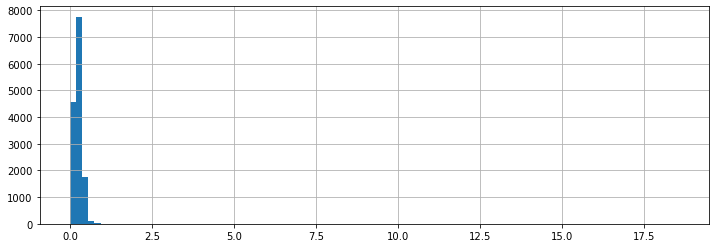

In [88]:
df['fsi'].hist(figsize=[12,4], bins=100);

In [89]:
# most of the high fsi are wrong due to incorrect input of lotsize or living area, 
# removing the very small lot sizes will take some out but we're going to remove the rest as well
df[df['fsi']>=1][['fsi','streetAddress','lotSizeSqFt', 'livingAreaSqFt','price']]

,fsi,streetAddress,lotSizeSqFt,livingAreaSqFt,price
977,4.03,854 Wild Rose Dr,435.00,"1,753.00","357,442.67"
3228,1.00,1317 Warrington Dr,"1,711.00","1,713.00","272,015.13"
4372,1.20,200 Galloway Ln,"2,500.00","3,000.00","436,250.68"
5077,1.50,11125 Currin Ln,"2,000.00","3,000.00","313,543.06"
5472,1.01,5047 Fort Clark Dr,"1,219.00","1,234.00","253,398.60"
5496,1.13,5069 Fort Clark Dr,"1,089.00","1,234.00","135,870.02"
6122,4.51,2604 Sutherland St,435.00,"1,961.00","687,223.14"
6129,1.56,2604 Watkins Way,"1,258.00","1,961.00","686,709.90"
6170,1.50,2607 Sutherland St,"1,306.00","1,961.00","745,797.00"
8400,1.03,401 Penny Kathleen Ct,"2,500.00","2,584.00","436,250.68"


### Dropping/correcting all the wrong rows in one cell

In [90]:
df.shape

(14241, 48)

In [91]:
# Dropping column parkingSpaces and capping garageSpaces to maximum 7
df = df.drop(columns=['garageSpaces'])
df.loc[(df['parkingSpaces'] > 5), 'parkingSpaces'] = 6
df.loc[(df['parkingSpaces'] == 0)&(df['numOfParkingFeatures']==1), 'parkingSpaces'] = 1

# Putting a threshold of 3 on number of stories
df.loc[(df['numOfStories']==4), 'numOfStories'] = 3

# Putting a threshold of 5 on number of security Features
df.loc[(df['numOfSecurityFeatures']==6), 'numOfSecurityFeatures'] = 5

# Living area outliers(due to wronge input, indices 705 and 2557 with living area > 15000):
df = df.drop(df[df['livingAreaSqFt'] > 16000].index)

# Lot Areas shown as less than 1000 sq.ft or more than 24 acres / 1,050,000
df = df.drop((df[df['lotSizeSqFt'] >= 1050000].index) | (df[df['lotSizeSqFt'] < 1000].index))
# wrong lot size input for address 166 Briarpatch Ct
df = df.drop(df[df['streetAddress']=='166 Briarpatch Ct'].index)
# clearly wrong price for these two listings
df = df.drop(df[df['streetAddress'].isin(['4209 Verano Dr', '9512 Veletta Pl'])==True].index)

# number of bathrooms:
# this listing showed 27 bathroom when it's 3 in reality
df.loc[(df['numOfBathrooms']==27), 'numOfBathrooms'] = 3
df['numOfBathrooms'] = df['numOfBathrooms'].round()

# dropping rows with 0 bedroom or bathroom(28 rows)
df = df.drop(df[(df['numOfBathrooms']==0) | ((df['numOfBedrooms']==0))].index)

# Excluding properties more than 100 years old
df = df[df['buildingAge'] < 100]

df.shape

(14133, 47)

In [92]:
# Let's check fsi once more to see if more data cleaning is necessary
df[df.fsi >= 1][['lotSizeSqFt','livingAreaSqFt','fsi','streetAddress','price']].sort_values(by='fsi', ascending=False)
# 1st, 2nd, 3rd, 5th & 10th records below are not single detached houses
# 410 Post Rd has incorrect lotSize

,lotSizeSqFt,livingAreaSqFt,fsi,streetAddress,price
9255,"1,655.00","2,809.00",1.70,1159 Curve St,"882,078.60"
6129,"1,258.00","1,961.00",1.56,2604 Watkins Way,"686,709.90"
6170,"1,306.00","1,961.00",1.50,2607 Sutherland St,"745,797.00"
5077,"2,000.00","3,000.00",1.50,11125 Currin Ln,"313,543.06"
9635,"1,219.00","1,560.00",1.28,4008 Teaff St,"492,706.66"
4372,"2,500.00","3,000.00",1.20,200 Galloway Ln,"436,250.68"
14532,"4,181.00","4,928.00",1.18,4609 Twin Valley Cir,"1,064,700.00"
5496,"1,089.00","1,234.00",1.13,5069 Fort Clark Dr,"135,870.02"
8400,"2,500.00","2,584.00",1.03,401 Penny Kathleen Ct,"436,250.68"
5472,"1,219.00","1,234.00",1.01,5047 Fort Clark Dr,"253,398.60"


In [93]:
listings_to_drop = ['1159 Curve St','2604 Watkins Way','2607 Sutherland St','4008 Teaff St','410 Post Road Dr','5047 Fort Clark Dr']
df = df.drop(df[df['streetAddress'].isin(listings_to_drop)].index)

<a id="outliers"></a>
### Handling outliers in price, lot size and living area

In [94]:
df.price.describe()

count       14,127.00
mean       529,221.72
std        459,360.74
min          5,748.24
25%        318,770.92
50%        418,061.60
75%        589,189.91
max     14,109,578.92
Name: price, dtype: float64

Average adjusted house price is 529,221.72


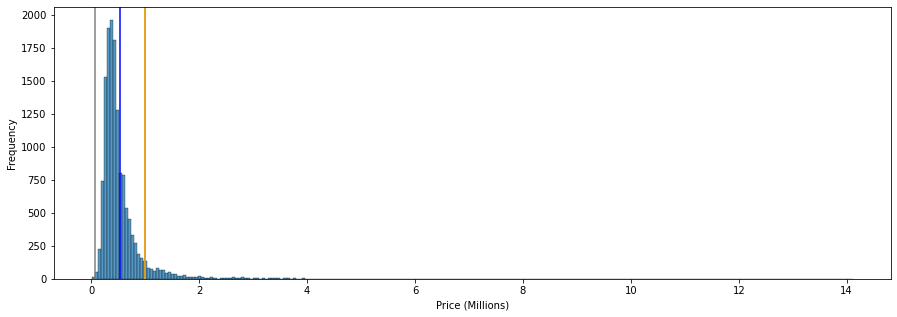

In [95]:
print(f"Average adjusted house price is {df['price'].mean():,.2f}")
plt.figure(figsize=[15,5])
sns.histplot(x=df['price']/1000000, bins=250)
plt.xlabel('Price (Millions)')
plt.ylabel('Frequency')
plt.axvline(x=0.5292, color='blue') # price mean
plt.axvline(x=0.0714, color='grey') # 1 standard deviation below mean
plt.axvline(x=0.9886, color='grey') # 1 standard deviation above mean

plt.axvline(x=0.9948, color='orange') # 75% percentile/q3 + 1.5*IQR
plt.show();

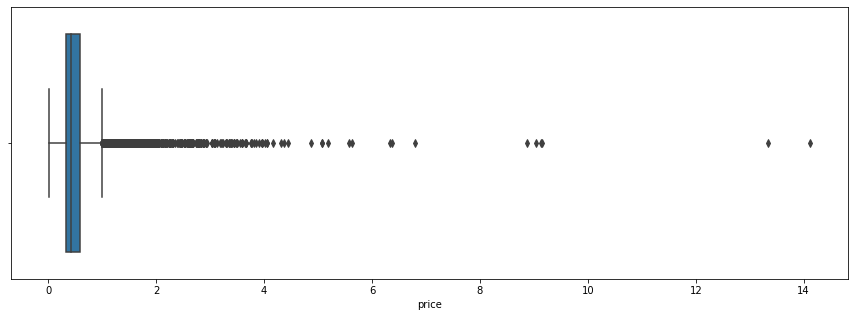

In [96]:
plt.figure(figsize=(15,5))
sns.boxplot(df['price']/1000000);

In [97]:
df.shape

(14127, 47)

In [98]:
# 1042 of records(7.4%) are more than 1 standard deviation away from mean
df[df.price > 988580].shape[0]

1042

In [99]:
df['zscore'] = (df['price'] - df['price'].mean()) / df['price'].std()
df[['price','zscore']].head()

,price,zscore
0,"313,074.02",-0.47
1,"299,130.00",-0.50
2,"262,905.19",-0.58
3,"250,836.96",-0.61
4,"250,732.44",-0.61


In [100]:
# the lower end of price will be processed considering a threshold of 150k given mostly wronge inputs
df.zscore.min()

-1.1395694794805944

In [101]:
df.zscore.max()

29.563600094620483

In [102]:
# Is 3 standard deviation away from mean a good upper limit?
# 229 houses were sold for more than $1.9 mil which represent less than 2% of records
print(round(df.price.mean() + (3 * df.price.std()), 2))
df[df.price>1907303].shape[0]

1907303.94


229

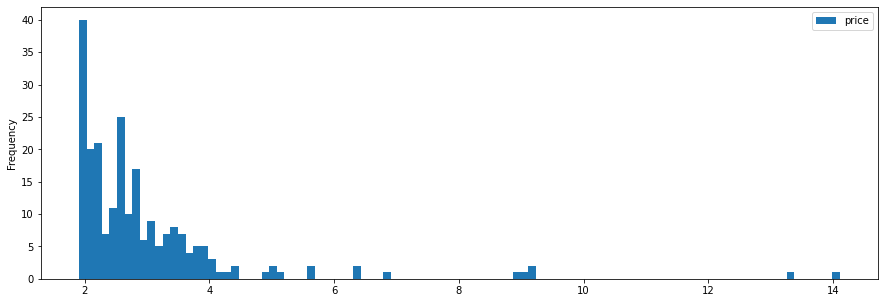

In [103]:
# this is that 1.6% of top prices
(df[['price']][df.price>1907303]/1000000).plot(kind='hist', bins=100, figsize=(15,5));

In [104]:
# we're going to remove the top 2% only which are 283 records with price greater than $1.7 million.
df.price.quantile(0.98).round(2)

1737201.55

In [105]:
# Dropping listings with original prices less than $150k and adjusted price above $1.7 million(data trimming)
df = df[(df.latestPrice > 150000) & (df.price < 1737200)]
df.shape

(13651, 48)

**Living Area**

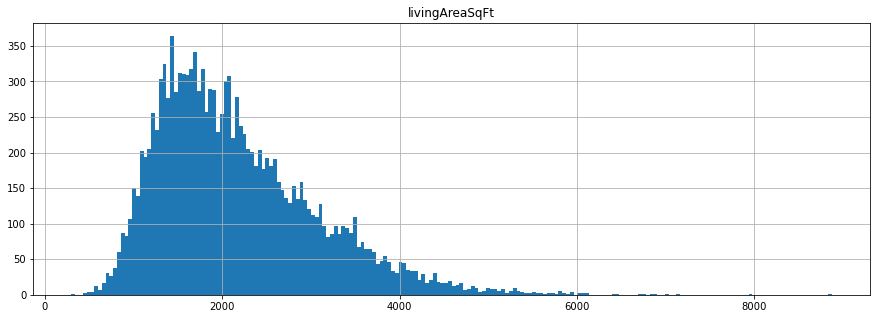

In [106]:
# With some of the price outliers as well as wrong inputs removed, we can again check the distribution of living area & lot size
# this chart now is more reasonable
df[['livingAreaSqFt']].hist(bins=200, figsize=(15,5));

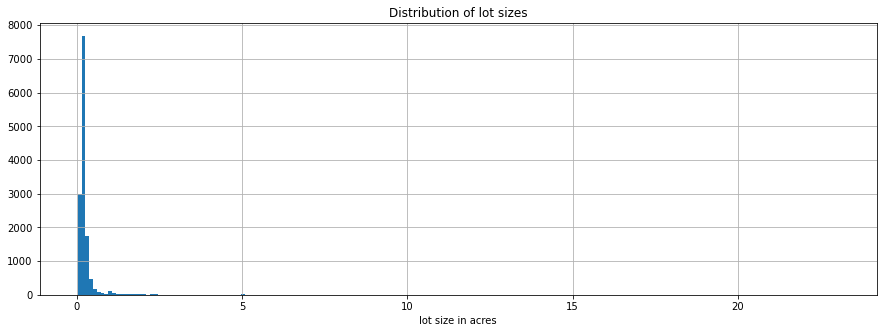

In [107]:
# lotsize is still very skewed given the legitimate big lots present in the dataset
# We can proceed to modeling but need to use some transformation like logarithm to reduce the influence of very big lot sizes
# We can also cap lot size at a certain percentile 
(df[['lotSizeSqFt']]/43560).hist(bins=200, figsize=(15,5));
plt.xlabel("lot size in acres")
plt.title("Distribution of lot sizes");

In [108]:
df.lotSizeSqFt.quantile(0.98).round(2)
# 1.2 acres

51836.4

In [109]:
df.lotSizeSqFt.quantile(0.99).round(2)
# about 1.9 acres

82328.4

In [110]:
# capping lot sizes at 1.2 acres(handling outliers through winsorization)
df.loc[(df['lotSizeSqFt'] > 61628), 'lotSizeSqFt'] = 61628

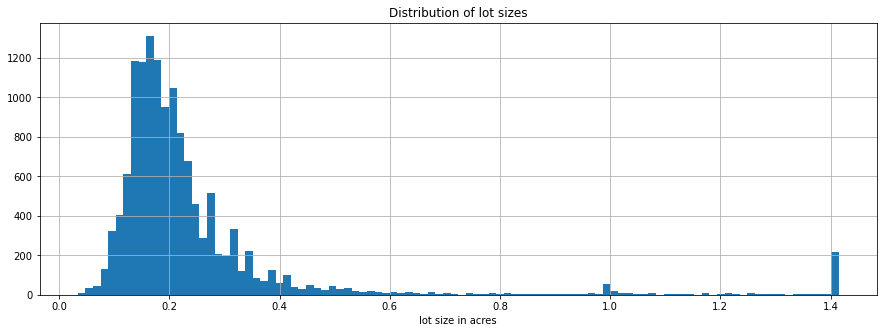

In [111]:
# Histogram after capping lot size
(df[['lotSizeSqFt']]/43560).hist(bins=100, figsize=(15,5));
plt.xlabel("lot size in acres")
plt.title("Distribution of lot sizes");

<a id="correlation"></a>
### Correlation between price(target variable) & other features

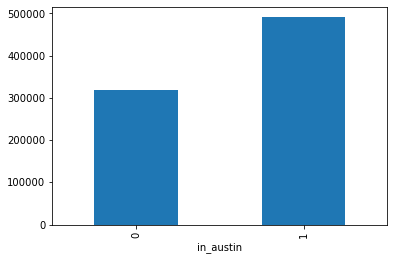

In [112]:
# whether listing is in Austin or not
df.groupby('in_austin')['price'].mean().plot(kind='bar');

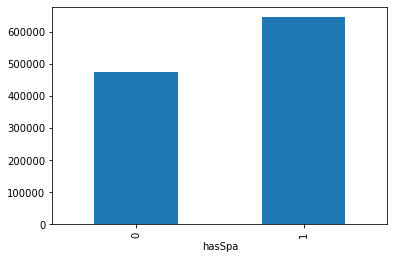

In [113]:
# with hasSpa:
df.groupby('hasSpa')['price'].mean().plot(kind='bar');

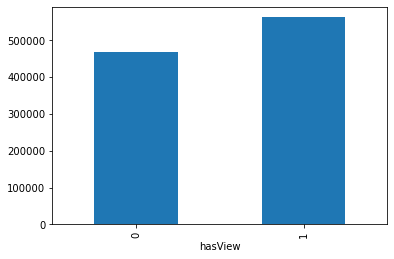

In [114]:
# with hasView:
df.groupby('hasView')['price'].mean().plot(kind='bar');

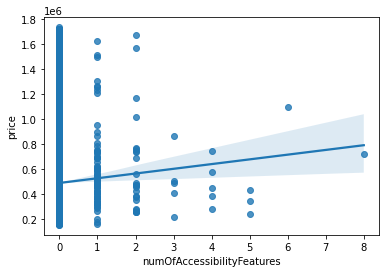

In [115]:
sns.regplot(data=df, x='numOfAccessibilityFeatures', y='price');

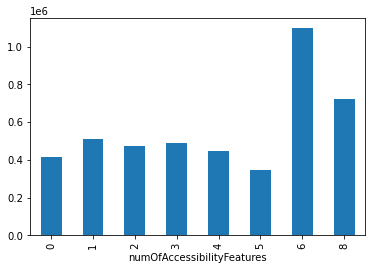

In [116]:
df.groupby('numOfAccessibilityFeatures')['price'].median().plot(kind='bar');

In [117]:
df['numOfAccessibilityFeatures'].value_counts()

0    13542
1       70
2       24
3        5
4        5
5        3
8        1
6        1
Name: numOfAccessibilityFeatures, dtype: int64

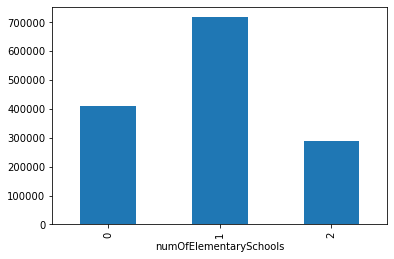

In [118]:
# number of elementary schools and middle schools are the only type of schools that pushes up the price
# there are few records of houses with 2 elementary schools so we can transform the feature to a boolean value
df.groupby('numOfElementarySchools')['price'].median().plot(kind='bar');

In [119]:
# we'll change this feature to a boolean column of close to elemetary school or not
df['numOfElementarySchools'].value_counts()

0    13104
1      487
2       60
Name: numOfElementarySchools, dtype: int64

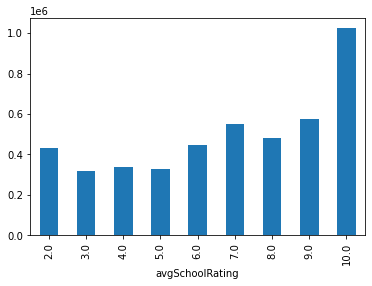

In [120]:
# with avgSchoolRating
# we'll round down the rating to whole numbers
df[['price','avgSchoolRating']].round().groupby('avgSchoolRating')['price'].median().plot(kind='bar');

In [121]:
# new features:
df['has_accessibility_feature'] = [1 if num >= 1 else 0 for num in df['numOfAccessibilityFeatures']]
df['has_elementary_school'] = [1 if num >= 1 else 0 for num in df['numOfElementarySchools']]
df['avgSchoolRating'] = df['avgSchoolRating'].round()

In [122]:
numeric_cols = df.select_dtypes(include=['number']).drop(columns=['zipcode','latestPrice']).columns.sort_values(ascending=False)

df[numeric_cols].corr().style.background_gradient(cmap='coolwarm', axis=None)

,zscore,yearBuilt,propertyTaxRate,price,parkingSpaces,numPriceChanges,numOfWindowFeatures,numOfWaterfrontFeatures,numOfStories,numOfSecurityFeatures,numOfPrimarySchools,numOfPatioAndPorchFeatures,numOfParkingFeatures,numOfMiddleSchools,numOfHighSchools,numOfElementarySchools,numOfCommunityFeatures,numOfBedrooms,numOfBathrooms,numOfAppliances,numOfAccessibilityFeatures,lotSizeSqFt,longitude,livingAreaSqFt,latitude,latest_saleyear,latest_salemonth,in_austin,has_school_walking,has_elementary_school,has_accessibility_feature,hasView,hasSpa,hasHeating,hasGarage,hasCooling,hasAssociation,fsi,buildingAge,avgSchoolSize,avgSchoolRating,avgSchoolDistance,age_binned,MedianStudentsPerTeacher
zscore,1.000000,0.019013,-0.074845,1.000000,0.167647,0.027394,0.091136,0.039638,0.244722,0.076549,-0.174413,0.108378,0.111282,0.120226,-0.222419,0.147017,-0.002959,0.345442,0.522084,0.048713,0.027073,0.390688,-0.245994,0.601971,0.106442,0.061853,0.043456,0.066685,0.037926,0.186827,0.036835,0.152171,0.177369,0.020823,0.094512,0.031342,-0.008241,0.058235,-0.019013,0.098678,0.402894,0.049502,0.071249,0.305263
yearBuilt,0.019013,1.000000,0.128200,0.019013,0.131238,-0.041381,0.075271,-0.014661,0.380671,0.150762,-0.057355,0.045157,0.021896,0.077464,-0.006620,0.026381,0.051347,0.318413,0.477968,0.089785,-0.006222,0.017502,-0.265057,0.420766,-0.122878,0.016185,0.004160,-0.102503,-0.337876,0.016094,-0.002309,0.110316,0.043941,-0.002339,0.038190,0.085748,0.650406,0.461075,-1.000000,0.315546,0.141028,0.341365,0.933571,0.105174
propertyTaxRate,-0.074845,0.128200,1.000000,-0.074845,-0.051457,-0.028128,0.017306,-0.003960,0.075416,0.011546,0.027026,0.000390,0.287316,-0.020923,-0.040785,-0.052877,0.034978,0.109430,0.089760,0.019295,-0.016223,-0.019315,-0.006400,0.113546,0.457622,-0.028059,0.002186,0.021267,-0.007519,-0.054864,-0.016996,0.051342,0.020780,0.018665,0.014387,0.031924,0.137241,0.125006,-0.128200,0.157532,0.187664,-0.015490,0.103433,-0.024825
price,1.000000,0.019013,-0.074845,1.000000,0.167647,0.027394,0.091136,0.039638,0.244722,0.076549,-0.174413,0.108378,0.111282,0.120226,-0.222419,0.147017,-0.002959,0.345442,0.522084,0.048713,0.027073,0.390688,-0.245994,0.601971,0.106442,0.061853,0.043456,0.066685,0.037926,0.186827,0.036835,0.152171,0.177369,0.020823,0.094512,0.031342,-0.008241,0.058235,-0.019013,0.098678,0.402894,0.049502,0.071249,0.305263
parkingSpaces,0.167647,0.131238,-0.051457,0.167647,1.000000,0.095560,0.048766,0.031193,0.106708,0.156351,-0.065666,0.220949,0.528450,0.053953,-0.063627,0.037051,0.084738,0.179232,0.211083,0.164929,0.074214,0.145187,-0.154505,0.237262,-0.019177,0.269844,0.104321,0.006079,-0.081744,0.037983,0.092619,0.183393,0.248629,0.050030,0.706614,0.075478,0.099857,0.024795,-0.131238,0.071116,0.109398,0.112793,0.114031,0.109231
numPriceChanges,0.027394,-0.041381,-0.028128,0.027394,0.095560,1.000000,0.003825,0.019940,0.105927,-0.005759,-0.017663,-0.014908,0.117432,0.019217,-0.035661,0.009948,0.043366,0.092257,0.101562,0.067767,-0.013762,0.027085,-0.056139,0.118411,0.014628,-0.008284,-0.006328,0.032591,0.016552,0.015037,-0.018036,0.068002,0.014984,0.034267,0.132320,0.044504,-0.026475,0.066118,0.041381,-0.028648,0.041509,-0.004270,-0.039140,0.053035
numOfWindowFeatures,0.091136,0.075271,0.017306,0.091136,0.048766,0.003825,1.000000,0.022826,0.055289,0.378973,-0.027982,0.356706,0.046680,0.020499,-0.056686,0.008428,0.020289,0.091754,0.101730,0.104173,-0.018954,0.038159,-0.121881,0.138898,0.016043,0.261296,0.043593,0.016090,-0.046963,0.012521,-0.013430,0.092201,-0.043820,0.034614,0.061968,0.044798,0.110282,0.059095,-0.075271,0.083269,0.121800,0.045976,0.068062,0.111714
numOfWaterfrontFeatures,0.039638,-0.014661,-0.003960,0.039638,0.031193,0.019940,0.022826,1.000000,0.013257,0.007047,-0.019046,0.044201,0.023179,-0.005188,-0.014152,0.020964,-0.003995,0.006082,-0.001289,0.017217,-0.002811,0.023048,-0.000326,0.009691,0.017021,0.044139,0.009682,0.003897,-0.007993,0.025077,-0.003485,0.038007,0.000836,0.003437,0.031950,-0.008780,-0.017787,-0.021

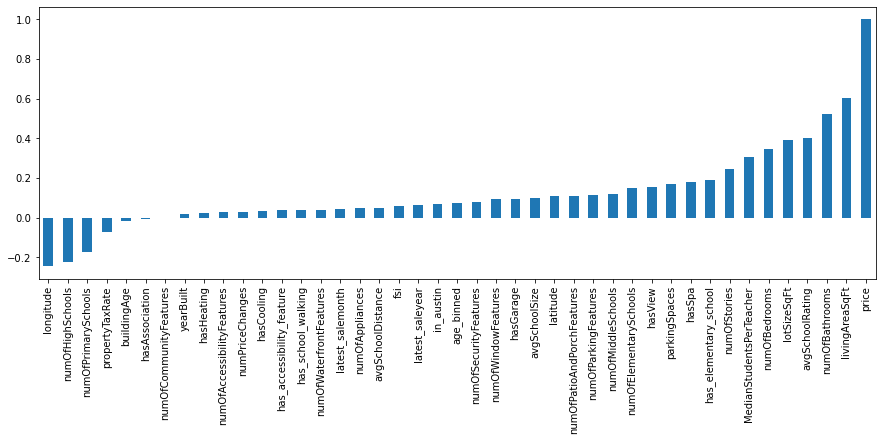

In [123]:
# numeric features correlated with price
df.drop(columns=['latestPrice','zipcode','zscore']).corr()['price'].sort_values().plot(kind='bar', figsize=(15,5));

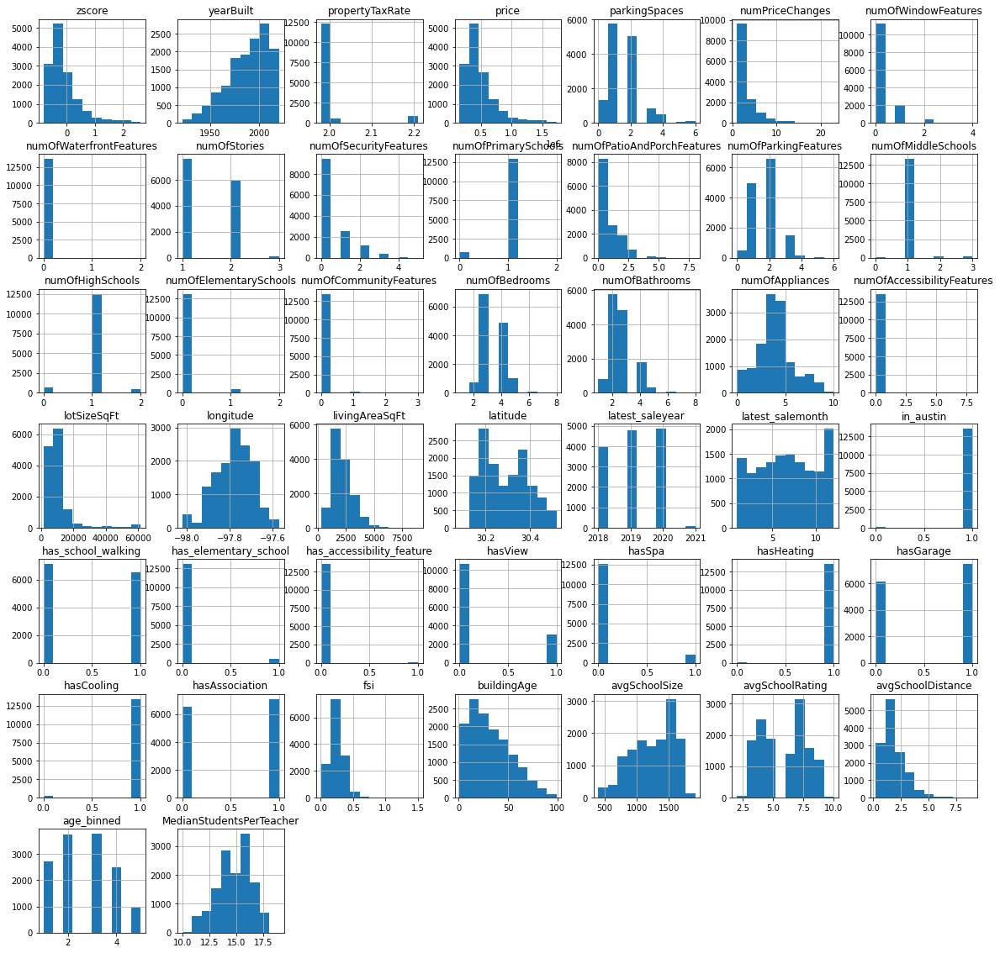

In [124]:
# given that most of our features are not normally distributed and we do have legitimate outliers within some features, 
# we can assume tree-based models will work better, we'll still test differnt algorithm to verify
pd.plotting.hist_frame(df[numeric_cols], figsize=(20,20));

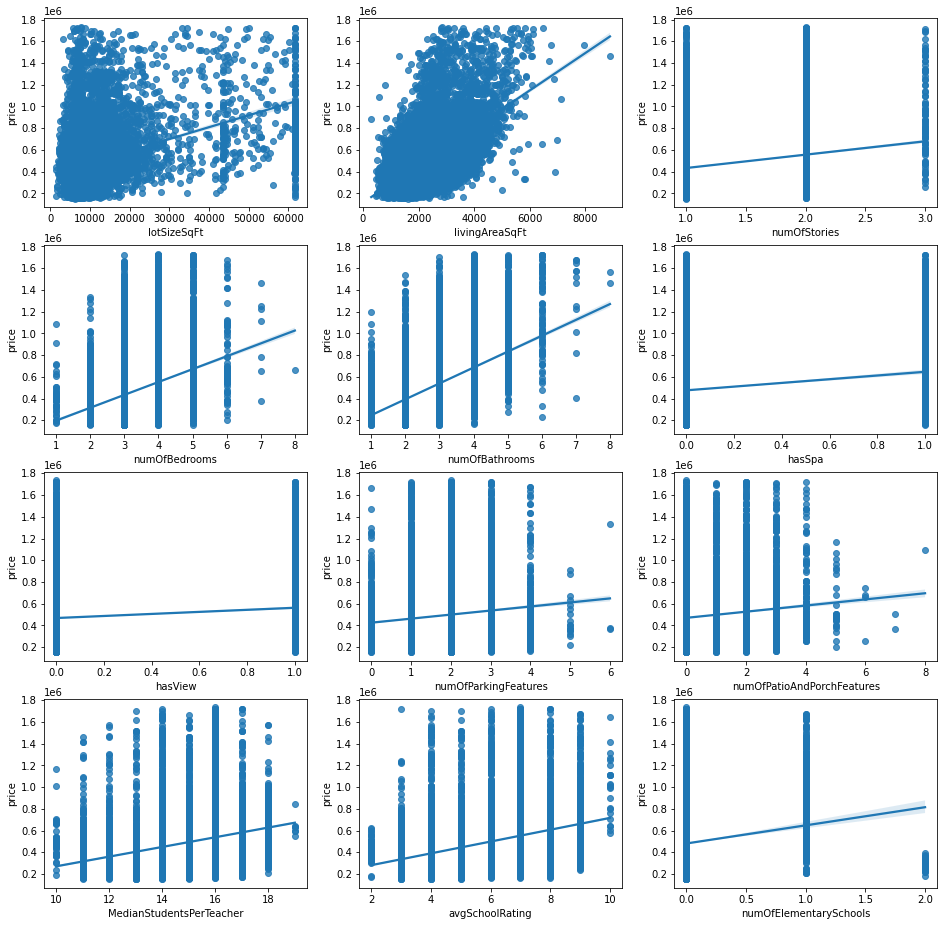

In [125]:
# features with the highest correlation with price
fig, ax = plt.subplots(4, 3, figsize=(16, 16))

sns.regplot(data=df, x='lotSizeSqFt', y='price', ax=ax[0][0])
sns.regplot(data=df, x='livingAreaSqFt', y='price', ax=ax[0][1])
sns.regplot(data=df, x='numOfStories', y='price', ax=ax[0][2])
sns.regplot(data=df, x='numOfBedrooms', y='price', ax=ax[1][0])
sns.regplot(data=df, x='numOfBathrooms', y='price', ax=ax[1][1])
sns.regplot(data=df, x='hasSpa', y='price', ax=ax[1][2])
sns.regplot(data=df, x='hasView', y='price', ax=ax[2][0])
sns.regplot(data=df, x='numOfParkingFeatures', y='price', ax=ax[2][1])
sns.regplot(data=df, x='numOfPatioAndPorchFeatures', y='price', ax=ax[2][2])
sns.regplot(data=df, x='MedianStudentsPerTeacher', y='price', ax=ax[3][0])
sns.regplot(data=df, x='avgSchoolRating', y='price', ax=ax[3][1])
sns.regplot(data=df, x='numOfElementarySchools', y='price', ax=ax[3][2]);

In [126]:
df['numOfSecurityFeatures'].value_counts()

0    9430
1    2572
2    1158
3     394
4      78
5      19
Name: numOfSecurityFeatures, dtype: int64

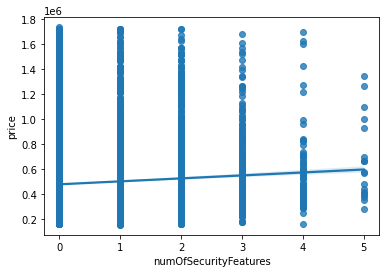

In [127]:
sns.regplot(data=df, x='numOfSecurityFeatures', y='price');

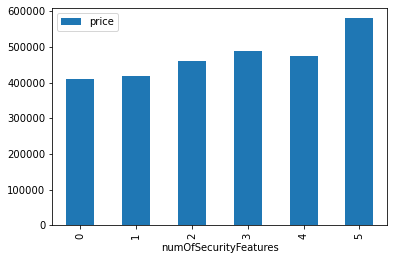

In [128]:
df[['numOfSecurityFeatures','price']].groupby('numOfSecurityFeatures').median().plot(kind='bar');

<a id='pca&kmeans' ></a>
### PCA & KMEANS to see if there are meaningful clusters

In [134]:
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

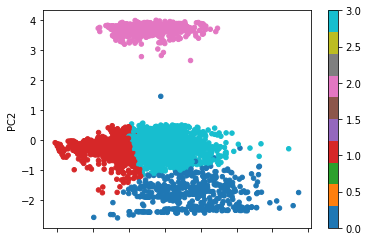

In [135]:
# testing which features can create meaningful clusters, removing outliers and noise shows more well-defined clusters
# But we can still see there are outliers
kmeans_features = ['propertyTaxRate', 'lotSizeSqFt', 'livingAreaSqFt', 'numOfBedrooms', 'numOfBathrooms']

X = df[kmeans_features]

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

model = KMeans(4, random_state=1)
clusters = model.fit_predict(X_scaled)

pca = PCA(2)
X_pca = pca.fit_transform(X_scaled)

pd.DataFrame(X_pca, columns=['PC1', 'PC2']).plot(kind='scatter',
                                                 x='PC1',
                                                 y='PC2',
                                                 c=clusters,
                                                 colormap='tab10');

In [136]:
df.to_csv("final_df.csv")